<strong>PROJET DE SUPERVISED LEARNING : PREDICTION DE CHURN</strong>

J'ai pour ce projet reçu un fichier csv de différentes commandes passées dans un intervalle de temps par des clients sur le site Vestiaire Collective. Ce csv contient les caractéristiques des commandes telles que la nature du vêtement de la commande (type d'habit, marque, la condition du vêtement, etc), le montant de la commande, ainsi que un id pour identifier le client et des infos relatives à ce dernier (l'age de son compte sur la plateforme, le moyen qui l'a emmené à visiter la plateforme, son genre ou encore le type d'appareil qu'il a utilisé lors de sa commande). Enfin ce site contient pour chaque id client une valeur booléene churn une indication qui indique si le client a abandonné la plateforme (vaut 1) ou continue de l'utiliser (vaut 0)

Le but de ce projet est de d'entraîner un modèle qui devra prédire pour chaque id_customer (des clients) le churn indiquant si un client a abandonné la plateforme au bout de l'intervalle de temps ou pas. Et je présenterai dans ce rapport le modèle que j'ai été emmené à choisir ainsi que ses résultats et les points essentiels que j'ai eus à traiter tout au long de ma réflexion.

<strong>PLAN:</strong>
<ol>
    <li> <I><strong>EDA: Exploratory Data Analysis</strong></I> </li>
    <li> <I><strong>Data cleaning and preprocessing </strong></I></li>
    <li> <I><strong>Choix du meilleur couple algorithme-encoding </strong></I></li>
    <li> <I><strong>Conclusion : Analyse des résultats et propositions d'améliorations</strong></I> </li>
</ol>
    
    

<h2>1.<strong><I> EDA: Exploratory Data Analysis</I></strong></h2>

On va commencer par importer les modules utiles pour ce projet et ensuite jeter un premier coup d'oeil à nos données brutes

In [1]:
import pandas as pd
import numpy as np
import pendulum as pt

import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder


from sklearn.decomposition import TruncatedSVD
from imblearn.over_sampling import SMOTE

from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn import neighbors

from sklearn.metrics import (confusion_matrix, precision_recall_curve, auc,
                             roc_curve, recall_score, classification_report, f1_score,
                             precision_recall_fscore_support, accuracy_score)

from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import reciprocal, uniform
import scipy.stats as ss

In [2]:
churn_data = pd.read_csv("data.csv")
churn_data.head(10)

,id_customer,geo,gender,device,acquisition_source,account_age,month,day,universe,category,brand,brand_group,material,condition,price,churned
0,6604,geo_3,gender_1,device_5,NaN,327.0,2.0,15.0,universe_3,category_11,brand_327,brand_group_1,material_25,condition_3,383.66,1.0
1,6604,geo_3,gender_1,device_5,NaN,327.0,12.0,20.0,universe_3,category_1,brand_466,brand_group_2,material_21,condition_3,813.13,1.0
2,1269,geo_3,gender_2,NaN,NaN,1524.0,10.0,8.0,universe_4,category_11,brand_414,brand_group_3,material_25,condition_3,628.28,0.0
3,1269,geo_3,gender_2,NaN,NaN,1524.0,11.0,7.0,universe_4,category_5,brand_361,brand_group_2,material_49,condition_3,220.58,0.0
4,1698,geo_4,gender_2,device_5,NaN,1320.0,8.0,17.0,universe_4,category_3,brand_306,brand_group_2,material_25,condition_3,4436.36,1.0
5,2673,geo_4,gender_2,device_1,NaN,1045.0,3.0,10.0,universe_4,category_5,brand_225,brand_group_2,material_8,condition_1,1588.80,0.0
6,2673,geo_4,gender_2,device_1,NaN,1045.0,4.0,27.0,universe_4,category_11,brand_1163,brand_group_2,material_25,condition_3,1579.58,0.0
7,2673,geo_4,gender_2,device_1,NaN,1045.0,2.0,2.0,universe_4,category_11,brand_1163,brand_group_2,material_25,condition_3,1324.64,0.0
8,2673,geo_4,gender_2,device_1,NaN,1045.0,4.0,15.0,universe_4,category_5,brand_668,brand_group_2,material_33,condition_3,857.21,0.0
9,2673,geo_4,gender_2,device_1,NaN,1045.0,2.0,23.0,universe_4,category_5,brand_225,brand_group_2,material_65,condition_2,1740.04,0.0


Une description des différentes colonnes se trouve ci-dessous; 
     - id_customer: unique identifier of the user
     - geo: geographical information about the user
     - gender: gender of the user (man/woman/...)
     - device: type of device the user is using
     - acquisition_source: marketing channel used to aquire the user
     - account_age: time since the user created her/his account
     ### order details
     - month: number of the month of the date of the order
     - day: number of the day of the date of the order
     - universe: high level category of the order (men/women/...)
     - category: category of the order (shoes/clothing/...)
     - brand: brand of the order (zara/hermes/...)
     - brand_group: group of the brand of the order (luxe/middle/...)
     - material: material of the order (leather/plastic/...)
     - condition: condition of the order (good condition/fair condition/...)
     - price: price of the product
     - churned: binary flag about whether the user churned (0=returned, 1=did not return)
     
On voit déjà ici que le dataset est rempli de valeurs de valeurs nulles (colonnesgender et acquisition_source). De plus, il va falloir aussi trouver la représentation la plus juste possible (subjectif) de l'ensemble des opérations d'un client (1 ou plusieurs lignes) dans une seule ligne.
La prochaine partie va explorer les différentes distributions des variables du jeu de données et essayer d'en tirer des insights utiles pour aider à prédire le churn. 

<strong> N.B : Nous supposerons dans toute l'étude que l'ensemble des données a été récolté sûr une année</strong>

In [3]:
fig = px.histogram(churn_data, x="month", title="Nombre de commandes par mois", )
fig.show()

In [4]:
fig = px.histogram(churn_data, x="day", title="Activité du site par jour dans un mois")
fig.show()

In [5]:
fig = px.histogram(churn_data, x="account_age", title="Répartition des durée d'existence des comptes utilisateurs")
fig.show()

In [6]:
fig = px.histogram(churn_data, x="acquisition_source", title="Répartioon des canaaux d'acquisition")
fig.show()
churn_data.acquisition_source.describe()

count                    11589
unique                     138
top       acquisition_source_1
freq                      4741
Name: acquisition_source, dtype: object

In [7]:
fig = px.histogram(churn_data, x="universe", title="univers produit")
fig.show()
#unbalanced class

In [8]:
fig = px.histogram(churn_data, x="geo", title="localisation clients")
fig.show()

In [9]:
test = churn_data.drop_duplicates(subset=["id_customer"])
fig = px.histogram(test, x="churned", title="Le churn des clients sur l'année d'étude")
fig.show()
test.describe()

,id_customer,account_age,month,day,price,churned
count,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,4999.50000,713.815800,6.868200,15.616100,950.159774,0.632900
std,2886.89568,608.387368,3.678068,8.966625,1955.401993,0.482038
min,0.00000,1.000000,1.000000,1.000000,4.240000,0.000000
25%,2499.75000,253.000000,4.000000,8.000000,271.382500,0.000000
50%,4999.50000,485.000000,7.000000,15.000000,492.380000,1.000000
75%,7499.25000,1084.000000,10.000000,24.000000,960.405000,1.000000
max,9999.00000,2644.000000,12.000000,31.000000,78825.140000,1.000000


In [10]:
fig = px.histogram(churn_data, x="price", title="distribution des montants des commandes")
fig.show()

In [11]:
fig = px.histogram(test, x="category", title="types d'articles commandés")
fig.show()

In [12]:
fig = px.histogram(churn_data, x="brand_group", title="Répartition de groupes de marques du catalogue")
fig.show()

In [13]:
fig = px.histogram(churn_data, x="brand", title="Les différentes marques du catalogue")
fig.show()
churn_data.brand.describe()

count         24554
unique         1230
top       brand_225
freq           1789
Name: brand, dtype: object

<strong>Insights : 1ère partie</strong>

Les différentes répartitions des colonnes du jeu de données indiquent un action différente selon la nature des variables:
<ul>
    <li>variables numériques: que ce soit pour la variable account_age ou le prix, la fenêtre de valeurs prises par les variables est trop large. Il faudra donc avant toute utilisation  à but prédictif écraser/réduire cet espace de valeurs. Nous appliquerons donc le logarithme en base 10 pour travailer avec ces variables</li>
    <li>variables catégorielles: Ici, je me pose la question de comment traiter ces valeurs lors du choix du modèle car il faudra encoder ces variables (one hot encoding ou ordinal encoding) avant de les passer à un algorithme (cf partie B)car les algorithmes ne prennent en compte que des chiffres et non des catégories. Le quesionnement vient ici du fait que encoder de cette façon agrandit le nombre de variables à prendre en compte par le modèle (et donc la complexité de celui-ci) car pour chaque valeur <I>Ui</I> de la variable universe par exemple, une nouvelle colonne boolénne <I>universe_Ui</I> sera ajoutée comme variable (valeur 1 si la ligne contenait Ui et 0  sinon). La matrice représentant notre jeu de donnéees sera creuse (beaucoup de zéros) et personnellement, je préfère travailler avec des données représentées par des matrices denses.
    <li>Le jeu de données n'est pas équilibré. On observe deux fois plus de clients n'étant pas retournés sur la plateforme (churn=1) que de clients y étant encore (churn=0) </li>
</ul>


Dans le cas d'une variable catégorielle comme la variable <I>brand</I>, plus de 1200 colonnes seront ajoutées comme variables. Pour essayer de diminuer la complexité du modèle à entraîner, je vais essayer de sélectionner les meilleures variables pour la prédiction de la variable churn. Cela introduit donc la prochaine partie qui est la sélection des meilleures variables catégorielles via le calcul d'une matrice de cramer. Nous représenterons cette matrice sous la forme d'une heatmap

In [14]:
cat_cols = ["universe", "geo", "gender", "device", "acquisition_source",
                       "category", "brand", "brand_group", "material", "condition", "churned"]
datas=churn_data.copy()



def cramers_v(x, y):
    confusion_matrix = pd.crosstab(x,y)
    chi2 = ss.chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2/n
    r,k = confusion_matrix.shape
    phi2corr = max(0, phi2-((k-1)*(r-1))/(n-1))
    rcorr = r-((r-1)**2)/(n-1)
    kcorr = k-((k-1)**2)/(n-1)
    return np.sqrt(phi2corr/min((kcorr-1),(rcorr-1)))

rows=[]
for var1 in datas[cat_cols]:
  col = []
  for var2 in datas[cat_cols] :
    cramers =cramers_v(datas[var1], datas[var2]) # Cramer's V test
    col.append(round(cramers,2)) # Keeping of the rounded value of the Cramer's V  
  rows.append(col)
  
cramers_results = np.array(rows)
df = pd.DataFrame(cramers_results, columns = cat_cols, index =cat_cols)

In [15]:
heat = go.Heatmap(z=df.values,
                  x=df.columns,
                  y=df.columns,
                  xgap=1, ygap=1
                   )

layout = go.Layout(title_text="correlation matrix", title_x=0.5, 
                   width=600, height=600,
                   xaxis_showgrid=False,
                   yaxis_showgrid=False,
                   yaxis_autorange='reversed')

fig=go.Figure(data=[heat], layout=layout)        
fig.show() 

<strong>Insights : 2ème partie</strong>

La heatmap ci-dessus nous apporte aussi plusieurs informations. Premièrement, les 3 variables catégorielles influençant le plus le churn d'un client semblent être <I>acquisition_source</I>, <I>geo</I> et <I>brand</I>

Ensuite, s'il semble que le reste des variables aient toutes un poids plus faible sur le fait qu'un client va churn, il apparaît aussi que des variables sont dépendantes, voire fortement dépendantes entre elles. Cela peut s'expliquer par la hiérarchie qui peut exister entre elles. Par exemple, la catégorie (chaussure, pantalon, robe, etc) d'un produit dépend de l'univers (homme, femme, enfant) dans lequel il se trouve.
Ainsi, pour la suite je ne travaillerai plus avec les colonnes universe et brand_group car elles sont toutes deux fortement corrélées de manière respective à category et brand (universe et brand group sont les variables parentes)

Ceci conclut donc notre EDA. Je vais maintenant appliquer les opérations énoncées plutôt dans la partie du cleaning et du dataprocessing.




<h2>2. <strong><I>Data cleaning and preprocessing</I></strong></h2>

In [16]:
#avoir le jour de l'année en fonction du mois et du jour
def get_day_of_year(month, day):
    return pt.parse(str(int(month))+"/"+str(int(day)), strict=False).day_of_year

#retourne le log en base 10 d'un réel
def log_real(reel):
    return np.log10(reel)

churn_data["norm_aged"] = (churn_data["account_age"] - churn_data["account_age"].mean())/churn_data["account_age"].std()
churn_data["day_of_year"] = churn_data.apply(lambda x: get_day_of_year(x["month"], x["day"]), axis=1)
churn_data["log_price"] = churn_data.apply(lambda x: log_real(x["price"]), axis=1)

churn_data

,id_customer,geo,gender,device,acquisition_source,account_age,month,day,universe,category,brand,brand_group,material,condition,price,churned,norm_aged,day_of_year,log_price
0,6604,geo_3,gender_1,device_5,NaN,327.0,2.0,15.0,universe_3,category_11,brand_327,brand_group_1,material_25,condition_3,383.66,1.0,-0.835405,46,2.583947
1,6604,geo_3,gender_1,device_5,NaN,327.0,12.0,20.0,universe_3,category_1,brand_466,brand_group_2,material_21,condition_3,813.13,1.0,-0.835405,355,2.910160
2,1269,geo_3,gender_2,NaN,NaN,1524.0,10.0,8.0,universe_4,category_11,brand_414,brand_group_3,material_25,condition_3,628.28,0.0,1.043203,282,2.798153
3,1269,geo_3,gender_2,NaN,NaN,1524.0,11.0,7.0,universe_4,category_5,brand_361,brand_group_2,material_49,condition_3,220.58,0.0,1.043203,312,2.343566
4,1698,geo_4,gender_2,device_5,NaN,1320.0,8.0,17.0,universe_4,category_3,brand_306,brand_group_2,material_25,condition_3,4436.36,1.0,0.723040,230,3.647027
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24549,7800,geo_2,gender_2,device_5,acquisition_source_61,222.0,10.0,3.0,universe_4,category_3,brand_192,brand_group_2,material_25,condition_2,764.18,0.0,-1.000195,277,2.883196
24550,7800,geo_2,gender_2,device_5,acquisition_source_61,222.0,9.0,3.0,universe_4,category_1,brand_491,brand_group_2,material_53,condition_3,4330.20,0.0,-1.000195,247,3.636508
24551,7800,geo_2,gender_2,device_5,acquisition_source_61,222.0,9.0,14.0,universe_4,category_3,brand_180,brand_group_2,material_25,condition_2,2449.34,0.0,-1.000195,258,3.389049
24552,6250,geo_2,gender_2,device_5,acquisition_source_1,350.0,1.0,17.0,universe_4,category_11,brand_44,brand_group_1,material_33,condition_2,377.91,1.0,-0.799308,17,2.577388


J'ai en premier ramené toutes les variables numériques sur la même echelle. J'ai aussi transformé les variables temporelles (month et day) en une variable day_of_year. Je vais maintenant gérer les valeurs nulles des variables catégorielles en les remplaçant par une valeur "unkonwn"

In [17]:
churn_data.fillna("unknown", inplace=True, downcast={"string": "unknown"})
churn_data.tail(10)

,id_customer,geo,gender,device,acquisition_source,account_age,month,day,universe,category,brand,brand_group,material,condition,price,churned,norm_aged,day_of_year,log_price
24544,7800,geo_2,gender_2,device_5,acquisition_source_61,222.0,5.0,24.0,universe_4,category_1,brand_668,brand_group_2,material_53,condition_1,1765.00,0.0,-1.000195,145,3.246745
24545,7800,geo_2,gender_2,device_5,acquisition_source_61,222.0,9.0,11.0,universe_4,category_1,brand_491,brand_group_2,material_53,condition_2,4025.78,0.0,-1.000195,255,3.604850
24546,7800,geo_2,gender_2,device_5,acquisition_source_61,222.0,8.0,20.0,universe_4,category_3,brand_918,brand_group_2,material_25,condition_1,1223.52,0.0,-1.000195,233,3.087611
24547,7800,geo_2,gender_2,device_5,acquisition_source_61,222.0,6.0,21.0,universe_4,category_11,brand_780,brand_group_2,material_34,condition_2,600.31,0.0,-1.000195,173,2.778376
24548,7800,geo_2,gender_2,device_5,acquisition_source_61,222.0,11.0,11.0,universe_4,category_3,brand_668,brand_group_2,material_56,condition_3,815.82,0.0,-1.000195,316,2.911594
24549,7800,geo_2,gender_2,device_5,acquisition_source_61,222.0,10.0,3.0,universe_4,category_3,brand_192,brand_group_2,material_25,condition_2,764.18,0.0,-1.000195,277,2.883196
24550,7800,geo_2,gender_2,device_5,acquisition_source_61,222.0,9.0,3.0,universe_4,category_1,brand_491,brand_group_2,material_53,condition_3,4330.20,0.0,-1.000195,247,3.636508
24551,7800,geo_2,gender_2,device_5,acquisition_source_61,222.0,9.0,14.0,universe_4,category_3,brand_180,brand_group_2,material_25,condition_2,2449.34,0.0,-1.000195,258,3.389049
24552,6250,geo_2,gender_2,device_5,acquisition_source_1,350.0,1.0,17.0,universe_4,category_11,brand_44,brand_group_1,material_33,condition_2,377.91,1.0,-0.799308,17,2.577388
24553,3903,geo_3,gender_2,device_4,unknown,733.0,6.0,20.0,universe_4,category_5,brand_525,brand_group_1,material_65,condition_3,549.46,1.0,-0.198216,172,2.739936


In [18]:
categorical_features = ["gender", "acquisition_source",
                       "category", "brand_group", "material", "condition"] #colonnes catégorielles à garder

values={cat: list(churn_data[cat].unique()) for cat in categorical_features}
categories_enc=[]
for cat in values.keys():
    categories_enc += values[cat]

numerical_features = ["log_price", "norm_aged"] #colonnes numériques mises à l'echelle

drop_columns = ["geo", "device", "month", "day", "brand"] #colonnes catégorielles non retenues pour le modèle
                  
values["acquisition_source"]

['unknown',
 'acquisition_source_129',
 'acquisition_source_12',
 'acquisition_source_1',
 'acquisition_source_61',
 'acquisition_source_81',
 'acquisition_source_72',
 'acquisition_source_135',
 'acquisition_source_18',
 'acquisition_source_25',
 'acquisition_source_29',
 'acquisition_source_82',
 'acquisition_source_78',
 'acquisition_source_32',
 'acquisition_source_53',
 'acquisition_source_102',
 'acquisition_source_38',
 'acquisition_source_126',
 'acquisition_source_23',
 'acquisition_source_136',
 'acquisition_source_110',
 'acquisition_source_98',
 'acquisition_source_137',
 'acquisition_source_14',
 'acquisition_source_26',
 'acquisition_source_30',
 'acquisition_source_97',
 'acquisition_source_28',
 'acquisition_source_105',
 'acquisition_source_71',
 'acquisition_source_43',
 'acquisition_source_91',
 'acquisition_source_49',
 'acquisition_source_4',
 'acquisition_source_22',
 'acquisition_source_39',
 'acquisition_source_108',
 'acquisition_source_52',
 'acquisition_sourc

Nous allons maintenant transformer notre dataset en ramenant ne gardant qu'une ligne par id_customer. Cela se fera en trois étapes:

<ul>
    <li> Ne garder que les variables numériques ainsi que les variables catégorielles retenues ci-dessus. Les variables catégorielles seront ensuite encodées avec la stratégie du one hot encoding. De plus, lacolonne day of year est ensuite transformée en une variable exprimant pour customer l'écart moyen de jours qu'il a eu entre chaque visite dans l'année. Le dataset résultant aura alors pour variables (id_customer et churned exclus) : <I>["gender", "acquisition_source",
                       "category", "brand_group", "material", "condition", "log_price", "norm_aged", "ecarts_visites"]</I></li>
    <li>Les lignes de ce nouveau dataset seront ensuite aggrégées (moyenne) par id_customer</li>
</ul>

In [19]:
x_train_cat = churn_data[["id_customer"]+categorical_features].copy()
# for col in categorical_features:
#     datas[col] = pd.Categorical(datas[col].to_list())
# x_train_cat = datas[["id_customer"]+categorical_features]

# #One hot encoding des colonnes indiquées dans categorical features

for f in categorical_features:
    x_train_cat[f] = pd.Categorical(x_train_cat[f], categories = values[f])
    dummies = pd.get_dummies(x_train_cat[f], prefix = f, prefix_sep = '_')
    x_train_cat = pd.concat([x_train_cat, dummies], axis = 1)
    
# #Supression des variables catégorielles d'origine + des colonnes drop_columns
x_train_cat.drop(categorical_features, axis = 1, inplace = True)
x_train_cat.head(5)

# x_train_cat[categorical_features].describe()
# enc =  OneHotEncoder(handle_unknown='ignore', categories=categories_enc)
# test_enc = enc.fit_transform(x_train_cat[categorical_features].values)
# test_enc

,id_customer,gender_gender_1,gender_gender_2,gender_gender_3,acquisition_source_unknown,acquisition_source_acquisition_source_129,acquisition_source_acquisition_source_12,acquisition_source_acquisition_source_1,acquisition_source_acquisition_source_61,acquisition_source_acquisition_source_81,...,material_material_51,material_material_20,material_material_39,material_material_23,material_material_6,condition_condition_3,condition_condition_1,condition_condition_2,condition_condition_4,condition_unknown
0,6604,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
1,6604,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2,1269,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
3,1269,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
4,1698,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0


Le one hot encoding a crée 234 variables

In [20]:
#Une ligne de variables one hotencoded par id_customer
x_train_cat = x_train_cat.groupby(["id_customer"]).mean()
x_train_cat.head(5)

,gender_gender_1,gender_gender_2,gender_gender_3,acquisition_source_unknown,acquisition_source_acquisition_source_129,acquisition_source_acquisition_source_12,acquisition_source_acquisition_source_1,acquisition_source_acquisition_source_61,acquisition_source_acquisition_source_81,acquisition_source_acquisition_source_72,...,material_material_51,material_material_20,material_material_39,material_material_23,material_material_6,condition_condition_3,condition_condition_1,condition_condition_2,condition_condition_4,condition_unknown
id_customer,,,,,,,,,,,,,,,,,,,,,
0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [21]:
#Une ligne de variables numériques par one hot encoding
x_train_num = churn_data[["id_customer"]+numerical_features]
x_train_num = x_train_num.groupby(["id_customer"]).mean()

In [22]:
x_train_num

,log_price,norm_aged
id_customer,,
0,2.312073,2.800966
1,3.400139,2.780563
2,3.157012,2.772716
3,2.220683,2.769577
4,3.014210,2.761730
...,...,...
9995,2.517592,-1.345470
9996,2.834192,-1.345470
9997,3.832390,-1.345470


In [23]:
def get_ecart_mobile(L):
    """
    Pour une liste L de n elements, calcule une liste D de n-1 éléments où D[i]=L[i+1]-L[i]
    Retourne l'écart type de D
    """
    interim = []
    if len(L)>1:
        for i in range(1,len(L)):
            interim.append(L[i]-L[i-1])
        return np.std(interim)
    else:
        return 0

def get_ecart_moyen_visites(id_cus):
    """
    trouve toutes les commandes passées pour un id_customer et retourne l'ecart moyen de jours entre deux visites sur la plteforme
    """
    list_days= list(churn_data[churn_data["id_customer"]==id_cus].day_of_year.sort_values())
    return get_ecart_mobile(list_days)
index = list(x_train_num.index)
ecarts = [get_ecart_moyen_visites(x) for x in index]
x_train_num["ecarts_visites"] = pd.DataFrame(ecarts)
x_train_num["ecarts_visites"] = (x_train_num["ecarts_visites"] - x_train_num["ecarts_visites"].mean())/x_train_num["ecarts_visites"].std()
x_train_num

,log_price,norm_aged,ecarts_visites
id_customer,,,
0,2.312073,2.800966,-0.382183
1,3.400139,2.780563,-0.382183
2,3.157012,2.772716,-0.382183
3,2.220683,2.769577,-0.382183
4,3.014210,2.761730,-0.382183
...,...,...,...
9995,2.517592,-1.345470,-0.382183
9996,2.834192,-1.345470,-0.382183
9997,3.832390,-1.345470,-0.382183


In [24]:
Y = churn_data.groupby(["id_customer"]).churned.mean().astype(int)
Y

id_customer
0       1
1       1
2       1
3       1
4       1
       ..
9995    0
9996    0
9997    1
9998    1
9999    1
Name: churned, Length: 10000, dtype: int32

In [25]:
news_datas = pd.concat([x_train_cat, x_train_num], axis=1)
news_datas.head(3)

,gender_gender_1,gender_gender_2,gender_gender_3,acquisition_source_unknown,acquisition_source_acquisition_source_129,acquisition_source_acquisition_source_12,acquisition_source_acquisition_source_1,acquisition_source_acquisition_source_61,acquisition_source_acquisition_source_81,acquisition_source_acquisition_source_72,...,material_material_23,material_material_6,condition_condition_3,condition_condition_1,condition_condition_2,condition_condition_4,condition_unknown,log_price,norm_aged,ecarts_visites
id_customer,,,,,,,,,,,,,,,,,,,,,
0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,2.312073,2.800966,-0.382183
1,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,3.400139,2.780563,-0.382183
2,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,3.157012,2.772716,-0.382183


Ci-dessus les premières lignes du nouveau jeu de données (10000 lignes contre plus de 24000 avant). Nous allons maintenant appliquer un pca sur notre nouveau jeu de données pour en avoir un aperçu en 3 dimensions

In [26]:
#Analyse de composante principales pour transformer notre jeu avec un espace de 236 variables en un jeu de données 
#évoluant dans un espace à 3 dimensions
visu = TruncatedSVD(n_components=3, n_iter=20, random_state=50)
visu_datas = visu.fit_transform(news_datas)

demo = pd.DataFrame(visu_datas)
demo.columns = ["x","y", "z"]
demo["churned"] = Y
fig = px.scatter_3d(demo, x='x', y='y', z='z',
              color='churned', title="Représentation 3D de nos clients et de leur churn")
fig.show()


On observe ainsi qu'il semblearait qu'une partie de nos churn=1 soit concentrée à la base de ce qui semble être un cône (ou un chapeau de sorcier dans Harry Potter). Cette figure me donne envie d'expérimenter knn comme algorithme de classification sur mon nouveau jeu de donnée. 

Cela conclut notre partie sur le preprocessing et le cleaning de notre dataset.

<p>
    
    
    
    
</p>
<h2>3. <strong><I> Choix du meilleur couple algorithme-encoding </I></strong></h2>

Dans cette partie, un benchmark de différentes méthodes de classifications d'apprentissage supervisé sur notre nouveau dataset couplé à des méthodes de réduction de dimensions et/ou des stratégies d'augmentation. Le but étant de choisir le modèle avec la meilleure performance.
Pour se faire, j'ai utilisé le ROC_AUC comme métric d'évaluation. Dans un premier temps, je vais vous présenter l'ensemble des idées que j'ai voulu expérimenter, ensuite je vous donnerai celles qui ont produit des résultats faméliques sur le jeu de données pour enfin préenter dans tableau les stratégies avec des résultats honnêtes (et donc la meilleure stratégie en se basant sur le roc_auc).
<p>
    
</p>

<ul>
    <li>Algorithmes supervisés testés pour la classification : toutes de la librairie sklearn. Il s'agit de knn, MLPClassifier (réseau de neuronne) et SVC (de la famille des SVM) et dans une moindre mesure decisionTree de la librairie sklearn</li>
    <li>Stratégie d'augmentation: en expérimentant d'abord les deux premiers axes ci-dessosu, je me suis rendu compte en observant le recall sur le test set que les modèles dans leur globalité étaient très perturbés par le fait que la répartition des churn parmi les 10000 customers ne soit pas équilibrée. J'ai donc pour y rémédier décider d'expérimenter l'augmentation du dataset (notamment du nombre d'observations de churn=0) en utilisant le module SMOTE de a librairie imblearn.</li>
    <li>Réduction de dimension: J'ai expérimenté comme méthodes le traditionnel et sûr PCA (TruncatedSVD de sklearn pour les matrices creuses) ainsi que un auto-encoder (VAE) codé sous keras (cf https://github.com/susanli2016/Machine-Learning-with-Python/blob/master/Autoencoder%20for%20Customer%20Churn.ipynb).</li>
</ul>

 
<p>
    
</p>

Ainsi, en testant les différentes combinaisons, voici ci-dessous les pires stratégies:
<ul>
      <li>De manière générale avec toutes les cominaisons, mes différents random search à fin d'optimiser les hyperparamètres du modèle se terminaient avec un modèle faisant du sur-apprentissage sur la classe churn=0. Raison pour laquelle j'ai à un moment essayer d'utiliser smote</li>
    <li> auto-encoder: Je l'ai entraîné/cross-validé/testé sur les 24000 lignes de commandes du dataset initial en encodant au préalable à l'aide du one hot encoding les variables catégorielles. Quelque soit l'algo utilisé, je dépassais au mieux un roc_auc de 0.50 Une illustration du type de performances obtenues est fournie ci-contre: <img src="img/vae_algos.jpg" width=300 height=300 /></li>
    
  
</ul>


Pour le reste des expérimentatons, l'ensemble des résultats est résumé dans le tableau ci-dessous:

<style>
table, th, td {
  border: 1px solid black;
  border-collapse: collapse;
}
th, td {
  padding: 15px;
}
</style>

<table style="width:100%">
  <tr>
    <th>Modèle</th>
    <th>Score Roc_AUC sur train set</th>
      <th>Score Roc_AUC sur test set</th>
  </tr>
  <tr>
    <td>One hot encoding + SVC</td>
    <td>0.6632</td>
    <td>0.6412</td>
  </tr>
  <tr>
    <td>One hot encoding + TruncadedSVD_100_compenents + SVC</td>
    <td>0.6735</td>
    <td>0.6541</td>
  </tr>
  <tr>
    <td>One hot encoding + TruncadedSVD_100_components + SVC</td>
    <td>0.8175</td>
    <td>0.6449</td>
  </tr>
  <tr>
    <td>One hot encoding + TruncadedSVD_100_components + MLP_classifier</td>
    <td>0.8175</td>
    <td>0.6449</td>
  </tr>
  <tr>
    <td>One hot encoding + TruncadedSVD_100_components + KNeighborgs_50</td>
    <td>0.6747</td>
    <td>0.6601</td>
  </tr>
  <tr>
    <td>One hot encoding + Smote + SVC</td>
    <td>0.6647</td>
    <td>0.6723</td>
  </tr>
  <tr>
    <td>One hot encoding + Smote + MLPClassifier</td>
    <td>0.9088</td>
    <td>0.7337</td>
  </tr>
  <tr>
    <td>One hot encoding + TruncadedSVD_100_components + Smote + MLPClassifier</td>
    <td>0.8996</td>
    <td>0.7095</td>
  </tr>
  
</table>

In [27]:
sm = SMOTE(random_state=42)
news_datas_res, y_res = sm.fit_resample(news_datas, Y ) #On crée un dataset augmenté où il y a autant d'observation de churn=1
                                                        #que de churn=0

df_train_res, df_test_res, y_train_res, y_test_res = train_test_split(news_datas_res, y_res, test_size=2000, random_state=42)
    
news_datas_res.shape

(12658, 236)

On a maintenant autant un jeu de données de 12658 (les 10000 clients d'origine + 2658 clinets synthétiques). Après avoir split ce nouveau dataset en jeu d'entraînement et jeu de tests avec 2000 observations dans ce dernier, on entraîne le réseau de neurone suivant:

              precision    recall  f1-score   support

           0       0.71      0.75      0.73       980
           1       0.75      0.71      0.73      1020

    accuracy                           0.73      2000
   macro avg       0.73      0.73      0.73      2000
weighted avg       0.73      0.73      0.73      2000



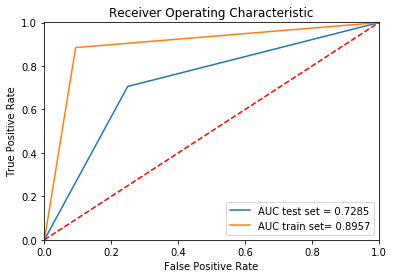

In [28]:
clf2_res = MLPClassifier(solver='adam', alpha=1e-8, hidden_layer_sizes=(100, 40, 10, 2), random_state=1, max_iter=2000)
clf2_res.fit(df_train_res, y_train_res)

pred2_res = clf2_res.predict(df_test_res)
print(classification_report(y_test_res, pred2_res))


fpr, tpr, thresholds = roc_curve(y_test_res, pred2_res)
fpr_t, tpr_t, thresholds_t = roc_curve(y_train_res, clf2_res.predict(df_train_res))
roc_auc = auc(fpr, tpr)
roc_auc_t = auc(fpr_t, tpr_t)
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, label='AUC test set = %0.4f'% roc_auc)
plt.plot(fpr_t, tpr_t, label='AUC train set= %0.4f'% roc_auc_t)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.001, 1])
plt.ylim([0, 1.001])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

<p>
    
    
</p>
<h2>4. <strong><li>Conclusion: propositions d'améliorations</li></strong></h2>

J'ai choisi comme modèle final un réseau de neuronnes entraîné sur un jeu de données artificiel. Ce jeu de données contient des observations de churn=0 synthétiques générés à partir de l'algorithme smote à fin d'avoir une répartition égale de la variable cible.

Ce modèle achève ainsi le meilleur score ROC_AUC parmi toutes mes expérimentations avec un AUC de 0,73. Cependant, il reste quelques axes d'améliorations que j'explorerai dans mes prochains trvux sur ce projet:

<ol>
    <li> Le modèle semble avoir un léger biais: avec un auc de 0.9 sur le train set, il y a encore de l'espace pour rendre le modèle plus complexe et lui faire apprendre plus du jeu de données. J'essairai d'atteindre un score de 0.95 sur le train set</li>
    <li>Il y a aussi de l'overfitting. L'écart de auc sur le jeu de train et de test (+ de 10%) suggère que l'algorithme a du mal à générer de nouveaux exemples. Les pistes d'améliorations seraint d'effectuer une régularisation voire d'augmenter le jeu de données si possible</li>
    <li> Les features: j'ai écarté des features catégorielles qui selon l'EDA semnlaient importantes dans l'exploration du modèle (principalement device et geo) je voulais un modèle qui ne soucie que des données relatives à la commande du client ou à ce dernir dans un premier temps. Une prochaine étape d'amélioration serait d'intégrer des variables relatives à l'expérience du client sur le site.</li>
    <li> Fine tuner les hyperparamètres du modèle: même si il est vrai que la plupart de mes randomsearch dans le cadre de ce projet ont eu à overfitter en ne reconnaissant qu'une classe, je pense que cela reste en fin de compte un moyen d'optimiser le modèle</li>
    
Ceci conclut le rapport de mon projet. Je l'ai trouvé stimulant et bien que je ne pense pas me passioner pour la prédiction de churn, j'ai appris beaucoup de choses. 
